In [1]:
import os
os.environ["THEANO_FLAGS"] = 'device=cuda,floatX=float32,force_device=True'
os.environ["PYTORCH_CUDA_ALLOC_CONF"] = "expandable_segments:True"

import scanpy as sc
import cell2location
from cell2location.models import RegressionModel
import pandas as pd
import numpy as np
import squidpy as sq
import jax
import torch
import pickle
import gc
import matplotlib as mpl
import matplotlib.pyplot as plt
from scipy.stats import chi2_contingency, fisher_exact
from scipy import sparse
import seaborn as sns

/users/PAS2713/iaradsouza1/.local/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/users/PAS2713/iaradsouza1/.conda/envs/local/envs/spatial_analysis/lib/python3.9/site-packages/xarray_schema/__init__.py:1: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import DistributionNotFound, get_distribution
/users/PAS2713/iaradsouza1/.conda/envs/local/envs/spatial_analysis/lib/python3.9/site-packages/numba/core/decorators.py:246: RuntimeWarning: nopython is set for njit and is ignored
  warnings.warn('nopython is set for njit and is ignored', RuntimeWarning)


In [2]:
print(jax.devices(), flush=True)
print(f"PyTorch: {torch.cuda.is_available()}")

[cuda(id=0)]
PyTorch: True


In [3]:
sample_ids = [
    "GSM8184312",
    "GSM8184313",
    "GSM8184314",
    "GSM8184315",
    "GSM8184316",
    "GSM8184317"
]
# Define neuron types (these are the neuronal types defined on the reference SEA-AD MTG)
excitatory = ['L2/3 IT', 'L4 IT', 'L5 ET', 'L5 IT', 'L5/6 NP', 'L6 CT', 'L6 IT', 'L6 IT Car3', 'L6b']
inhibitory = ['Lamp5', 'Lamp5_Lhx6', 'Pax6', 'Pvalb', 'Sncg', 'Sst', 'Sst Chodl', 'Vip', 'Chandelier']
all_neurons = excitatory + inhibitory

# Define layer groups
outer_neurons = ['L2/3 IT']
inner_neurons = ['L4 IT', 'L5 ET', 'L5 IT', 'L5/6 NP', 'L6 CT', 'L6 IT', 'L6 IT Car3', 'L6b']

In [5]:
results = {}
for sample_id in sample_ids:
    ref_adata = sc.read_h5ad(f"c2l_res/nAD/{sample_id}.h5ad")
    ref_model = cell2location.models.Cell2location.load(f"c2l_res/nAD/{sample_id}", ref_adata)
    ref_model.export_posterior(ref_adata, sample_kwargs={'num_samples': 1000, 'batch_size': 2500})
   
    # Get abundances
    celltypes = ref_adata.uns['mod']['factor_names']
    print(f"Columns: {celltypes}")
    ref_adata.obs[celltypes] = ref_adata.obsm['q05_cell_abundance_w_sf']

    abundances = ref_adata.obs[celltypes]
    abundances['total_neurons'] = abundances[all_neurons].sum(axis=1)
    abundances['total_cells'] = abundances.sum(axis=1)
    abundances['neuron_fraction'] = abundances['total_neurons'] / abundances['total_cells']

    ref_adata.obs['total_cells'] = abundances['total_cells']
    ref_adata.obs['total_neurons'] = abundances['total_neurons']
    ref_adata.obs['neuron_rich'] = abundances['neuron_fraction'] >= abundances['neuron_fraction'].quantile(0.1)

    results[sample_id] = ref_adata

INFO     File c2l_res/nAD/GSM8184312/model.pt already downloaded                                                   


/users/PAS2713/iaradsouza1/.conda/envs/local/envs/spatial_analysis/lib/python3.9/site-packages/scvi/model/base/_utils.py:66: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  mo

Epoch 1/30000:   0%|          | 1/30000 [00:00<3:44:37,  2.23it/s, v_num=1]

`Trainer.fit` stopped: `max_steps=1` reached.


Sampling global variables, sample: 100%|██████████| 999/999 [00:18<00:00, 52.94it/s]
Columns: ['Astro', 'Chandelier', 'Endo', 'L2/3 IT', 'L4 IT', 'L5 ET', 'L5 IT', 'L5/6 NP', 'L6 CT', 'L6 IT', 'L6 IT Car3', 'L6b', 'Lamp5', 'Lamp5_Lhx6', 'Micro-PVM', 'OPC', 'Oligo', 'Pax6', 'Pvalb', 'Sncg', 'Sst', 'Sst Chodl', 'VLMC', 'Vip']


/tmp/slurmtmp.41898188/ipykernel_3116292/2619553208.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  abundances['total_neurons'] = abundances[all_neurons].sum(axis=1)
/tmp/slurmtmp.41898188/ipykernel_3116292/2619553208.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  abundances['total_cells'] = abundances.sum(axis=1)
/tmp/slurmtmp.41898188/ipykernel_3116292/2619553208.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

INFO     File c2l_res/nAD/GSM8184313/model.pt already downloaded                                                   


/users/PAS2713/iaradsouza1/.conda/envs/local/envs/spatial_analysis/lib/python3.9/site-packages/scvi/model/base/_utils.py:66: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  mo

Epoch 1/30000:   0%|          | 1/30000 [00:00<1:03:45,  7.84it/s, v_num=1]

`Trainer.fit` stopped: `max_steps=1` reached.


Sampling global variables, sample: 100%|██████████| 999/999 [00:18<00:00, 54.05it/s]
Columns: ['Astro', 'Chandelier', 'Endo', 'L2/3 IT', 'L4 IT', 'L5 ET', 'L5 IT', 'L5/6 NP', 'L6 CT', 'L6 IT', 'L6 IT Car3', 'L6b', 'Lamp5', 'Lamp5_Lhx6', 'Micro-PVM', 'OPC', 'Oligo', 'Pax6', 'Pvalb', 'Sncg', 'Sst', 'Sst Chodl', 'VLMC', 'Vip']


/tmp/slurmtmp.41898188/ipykernel_3116292/2619553208.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  abundances['total_neurons'] = abundances[all_neurons].sum(axis=1)
/tmp/slurmtmp.41898188/ipykernel_3116292/2619553208.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  abundances['total_cells'] = abundances.sum(axis=1)
/tmp/slurmtmp.41898188/ipykernel_3116292/2619553208.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

INFO     File c2l_res/nAD/GSM8184314/model.pt already downloaded                                                   


/users/PAS2713/iaradsouza1/.conda/envs/local/envs/spatial_analysis/lib/python3.9/site-packages/scvi/model/base/_utils.py:66: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  mo

Epoch 1/30000:   0%|          | 1/30000 [00:00<1:02:37,  7.98it/s, v_num=1]

`Trainer.fit` stopped: `max_steps=1` reached.


Sampling global variables, sample: 100%|██████████| 999/999 [00:18<00:00, 54.27it/s]
Columns: ['Astro', 'Chandelier', 'Endo', 'L2/3 IT', 'L4 IT', 'L5 ET', 'L5 IT', 'L5/6 NP', 'L6 CT', 'L6 IT', 'L6 IT Car3', 'L6b', 'Lamp5', 'Lamp5_Lhx6', 'Micro-PVM', 'OPC', 'Oligo', 'Pax6', 'Pvalb', 'Sncg', 'Sst', 'Sst Chodl', 'VLMC', 'Vip']


/tmp/slurmtmp.41898188/ipykernel_3116292/2619553208.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  abundances['total_neurons'] = abundances[all_neurons].sum(axis=1)
/tmp/slurmtmp.41898188/ipykernel_3116292/2619553208.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  abundances['total_cells'] = abundances.sum(axis=1)
/tmp/slurmtmp.41898188/ipykernel_3116292/2619553208.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

INFO     File c2l_res/nAD/GSM8184315/model.pt already downloaded                                                   


/users/PAS2713/iaradsouza1/.conda/envs/local/envs/spatial_analysis/lib/python3.9/site-packages/scvi/model/base/_utils.py:66: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  mo

Epoch 1/30000:   0%|          | 1/30000 [00:00<1:05:32,  7.63it/s, v_num=1]

`Trainer.fit` stopped: `max_steps=1` reached.


Sampling global variables, sample: 100%|██████████| 999/999 [00:18<00:00, 53.99it/s]
Columns: ['Astro', 'Chandelier', 'Endo', 'L2/3 IT', 'L4 IT', 'L5 ET', 'L5 IT', 'L5/6 NP', 'L6 CT', 'L6 IT', 'L6 IT Car3', 'L6b', 'Lamp5', 'Lamp5_Lhx6', 'Micro-PVM', 'OPC', 'Oligo', 'Pax6', 'Pvalb', 'Sncg', 'Sst', 'Sst Chodl', 'VLMC', 'Vip']


/tmp/slurmtmp.41898188/ipykernel_3116292/2619553208.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  abundances['total_neurons'] = abundances[all_neurons].sum(axis=1)
/tmp/slurmtmp.41898188/ipykernel_3116292/2619553208.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  abundances['total_cells'] = abundances.sum(axis=1)
/tmp/slurmtmp.41898188/ipykernel_3116292/2619553208.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

INFO     File c2l_res/nAD/GSM8184316/model.pt already downloaded                                                   


/users/PAS2713/iaradsouza1/.conda/envs/local/envs/spatial_analysis/lib/python3.9/site-packages/scvi/model/base/_utils.py:66: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  mo

Epoch 1/30000:   0%|          | 1/30000 [00:00<1:01:08,  8.18it/s, v_num=1]

`Trainer.fit` stopped: `max_steps=1` reached.


Sampling global variables, sample: 100%|██████████| 999/999 [00:18<00:00, 54.51it/s]
Columns: ['Astro', 'Chandelier', 'Endo', 'L2/3 IT', 'L4 IT', 'L5 ET', 'L5 IT', 'L5/6 NP', 'L6 CT', 'L6 IT', 'L6 IT Car3', 'L6b', 'Lamp5', 'Lamp5_Lhx6', 'Micro-PVM', 'OPC', 'Oligo', 'Pax6', 'Pvalb', 'Sncg', 'Sst', 'Sst Chodl', 'VLMC', 'Vip']


/tmp/slurmtmp.41898188/ipykernel_3116292/2619553208.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  abundances['total_neurons'] = abundances[all_neurons].sum(axis=1)
/tmp/slurmtmp.41898188/ipykernel_3116292/2619553208.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  abundances['total_cells'] = abundances.sum(axis=1)
/tmp/slurmtmp.41898188/ipykernel_3116292/2619553208.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

INFO     File c2l_res/nAD/GSM8184317/model.pt already downloaded                                                   


/users/PAS2713/iaradsouza1/.conda/envs/local/envs/spatial_analysis/lib/python3.9/site-packages/scvi/model/base/_utils.py:66: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  mo

Epoch 1/30000:   0%|          | 1/30000 [00:00<57:31,  8.69it/s, v_num=1]

`Trainer.fit` stopped: `max_steps=1` reached.


Sampling global variables, sample: 100%|██████████| 999/999 [00:18<00:00, 55.25it/s]
Columns: ['Astro', 'Chandelier', 'Endo', 'L2/3 IT', 'L4 IT', 'L5 ET', 'L5 IT', 'L5/6 NP', 'L6 CT', 'L6 IT', 'L6 IT Car3', 'L6b', 'Lamp5', 'Lamp5_Lhx6', 'Micro-PVM', 'OPC', 'Oligo', 'Pax6', 'Pvalb', 'Sncg', 'Sst', 'Sst Chodl', 'VLMC', 'Vip']


/tmp/slurmtmp.41898188/ipykernel_3116292/2619553208.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  abundances['total_neurons'] = abundances[all_neurons].sum(axis=1)
/tmp/slurmtmp.41898188/ipykernel_3116292/2619553208.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  abundances['total_cells'] = abundances.sum(axis=1)
/tmp/slurmtmp.41898188/ipykernel_3116292/2619553208.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

In [6]:
for sample_id in sample_ids:
    results[sample_id].write_h5ad(f"c2l_res/nAD/{sample_id}_with_cells.h5ad")

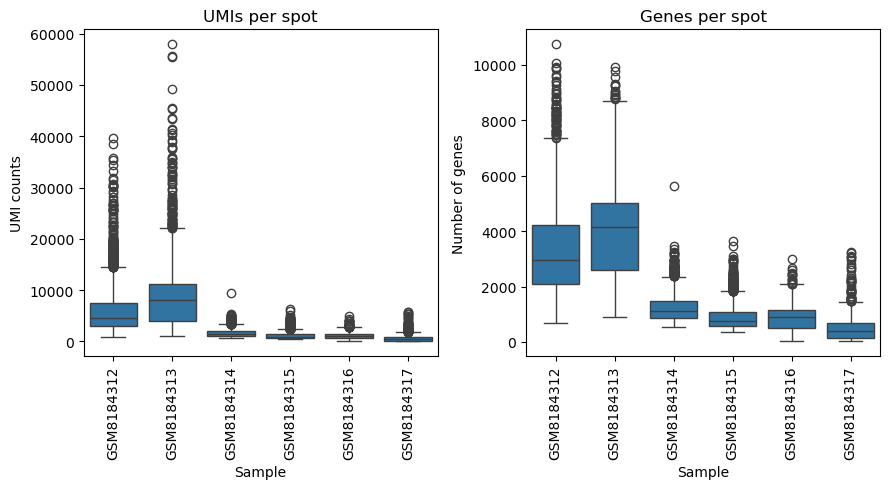

In [7]:
all_df = []
for sample_id in sample_ids:
    ad = sc.read_h5ad(f"c2l_res/nAD/{sample_id}_with_cells.h5ad")
    df = ad.obs[['total_counts', 'n_genes_by_counts']].copy()
    df['sample'] = sample_id
    all_df.append(df)

combined_df = pd.concat(all_df, ignore_index=True)

# Plot distributions
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(9, 5))

# UMI counts boxplot
sns.boxplot(data=combined_df, x='sample', y='total_counts', ax=ax1)
ax1.set_xlabel('Sample')
ax1.set_ylabel('UMI counts')
ax1.set_title('UMIs per spot')
ax1.tick_params(axis='x', rotation=90)

# Genes boxplot
sns.boxplot(data=combined_df, x='sample', y='n_genes_by_counts', ax=ax2)
ax2.set_xlabel('Sample')
ax2.set_ylabel('Number of genes')
ax2.set_title('Genes per spot')
ax2.tick_params(axis='x', rotation=90)

plt.tight_layout()

plt.savefig("results/nAD/umi_genes_dist.png")
plt.show()

Only the samples 12 and 13 were selected for the analysis. 

In [13]:
def plot_spatial_panels(
    adata,
    markers,
    region_map,
    cluster_col = "spatial_cluster",
    save_path = None,
    ncols = 4,
    region_spot_size = 3,
    gene_spot_size = 9,
    cmap = "viridis"
):
    """
    Make a multi-panel figure:
      - Panel 1: regions scatter (derived from cluster -> region mapping dict)
      - Panels 2..: gene feature plots from `markers` dict (layer -> [genes])

    Unmapped clusters are labeled as 'unknown'.

    Parameters
    ----------
    adata : AnnData
        Spatial AnnData with .obsm['spatial'] and a cluster column in .obs.
    markers : dict[str, list[str]]
        Layer -> list of marker genes.
    region_map : dict[str, list[str]]
        Region name -> list of cluster labels to map from `cluster_col`.
        Cluster labels can be strings or ints; they are compared as strings.
    cluster_col : str
        Column in adata.obs containing cluster labels to map.
    save_path : str or None
        If provided, save the figure to this path.
    ncols : int
        Number of columns in the panel grid.
    region_spot_size : int
        Point size for the regions panel.
    gene_spot_size : int
        Point size for the gene feature panels.
    cmap : str
        Colormap for feature plots.
    """

    # ---- coordinates
    xy = adata.obsm["spatial"].astype(float)
    x, y = xy[:, 0], xy[:, 1]

    # ---- build cluster -> region reverse map (robust to int/str)
    rev_map = {str(c): reg for reg, codes in region_map.items() for c in codes}

    # ---- derive regions from cluster column; unmapped -> 'unknown'
    if cluster_col not in adata.obs:
        raise KeyError(f"'{cluster_col}' not found in adata.obs.")
    clusters_str = adata.obs[cluster_col].astype(str)
    regions_series = clusters_str.map(rev_map).fillna("unknown")

    # ---- helper to get expression vector
    def get_expr(gene: str) -> np.ndarray:
        if gene not in adata.var_names:
            # return NaNs to keep layout; you can also choose to skip instead
            return np.full(adata.n_obs, np.nan)
        Xg = adata[:, gene].X
        if sparse.issparse(Xg):
            Xg = Xg.toarray()
        return np.asarray(Xg).ravel()

    # ---- flatten markers to (layer, gene) pairs
    lg_pairs = [(layer, g) for layer, genes in markers.items() for g in genes]
    n_panels = 1 + len(lg_pairs)  # 1 for regions
    nrows = int(np.ceil(n_panels / ncols))

    fig, axes = plt.subplots(nrows, ncols, figsize=(4 * ncols, 4 * nrows), squeeze=False)

    # ---- panel 1: regions with legend
    ax0 = axes[0, 0]
    cats = pd.Categorical(regions_series)
    # ensure 'unknown' is last in legend ordering
    cat_list = [c for c in cats.categories if c != "unknown"] + (["unknown"] if "unknown" in cats.categories else [])
    colors = plt.cm.tab20(np.linspace(0, 1, max(1, len(cat_list))))
    color_map = dict(zip(cat_list, colors))

    for reg in cat_list:
        mask = (regions_series == reg).values
        if mask.any():
            ax0.scatter(x[mask], y[mask], s=region_spot_size, color=color_map[reg], label=reg)

    ax0.set_title("Regions")
    ax0.set_aspect("equal")
    ax0.invert_yaxis()
    ax0.axis("off")
    ax0.legend(title="Region", loc="upper right", frameon=True, markerscale=max(1, region_spot_size / 3))

    # ---- panels 2..: feature plots
    for i, (layer, gene) in enumerate(lg_pairs, start=1):
        ax = axes[i // ncols, i % ncols]
        expr = get_expr(gene)
        sc = ax.scatter(x, y, s=gene_spot_size, c=expr, cmap=cmap, linewidths=0)
        ax.set_title(f"{layer} – {gene}")
        ax.set_aspect("equal")
        ax.invert_yaxis()
        ax.axis("off")
        cbar = plt.colorbar(sc, ax=ax, fraction=0.046, pad=0.04)
        cbar.set_label("expression")

    # ---- hide any unused axes
    for j in range(n_panels, nrows * ncols):
        axes[j // ncols, j % ncols].axis("off")

    plt.tight_layout()

    if save_path:
        os.makedirs(os.path.dirname(save_path), exist_ok=True)
        plt.savefig(save_path, dpi=300, bbox_inches="tight")
        plt.close(fig)
        print(f"✅ Figure saved to: {save_path}")
    else:
        plt.show()

In [4]:
markers = {
    "meningeal": ['DCN', 'PDGFRA'],
    "L1": ['RELN', 'CRH', 'NDNF'],
    "L2": ['HPCAL1', 'LAMP5', 'SATB2'],
    "L3": ['CUX2', 'BCL11B'],
    "L4": ['RORB', 'TSHZ2', 'SCNN1A'],
    "L5/6": ['SEMA3E', 'KRT17', 'BCL11B', 'FEZF2', "PCP4", "TLE4", "FOXP2", "NTNG2"],
    "white": ['MBP', 'MOBP']
}

## Sample GSM8184312

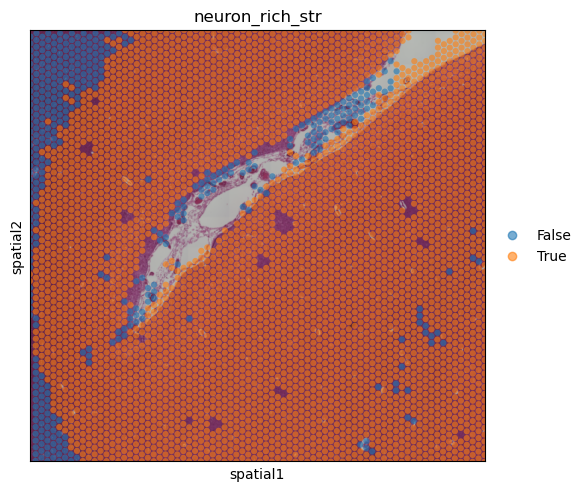

In [4]:
adata = sc.read_h5ad("c2l_res/nAD/GSM8184312_with_cells.h5ad")
adata.obs["neuron_rich_str"] = adata.obs["neuron_rich"].astype(str)
adata_n = adata[adata.obs['neuron_rich_str'] == "True"]

x = adata_n.obsm["spatial"][:, 0].astype(float)
y = adata_n.obsm["spatial"][:, 1].astype(float)
pad = 0
xmin, xmax = np.nanmin(x) - pad, np.nanmax(x) + pad
ymin, ymax = np.nanmin(y) - pad, np.nanmax(y) + pad
sq.pl.spatial_scatter(adata, color="neuron_rich_str", size=1.3, 
                      crop_coord=[(xmin, ymin, xmax, ymax)], alpha=0.6)

/users/PAS2713/iaradsouza1/.conda/envs/local/envs/spatial_analysis/lib/python3.9/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


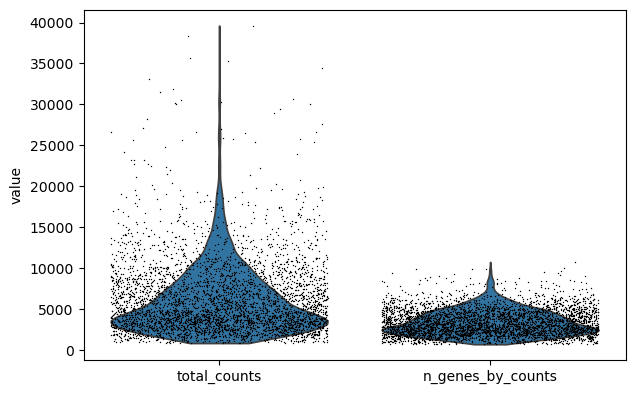

Median UMIs: 4911.0
Median number of genes: 3091.5


In [11]:
sc.pl.violin(adata_n, ['total_counts', 'n_genes_by_counts'], 
             jitter=0.4)
print(f"Median UMIs: {adata_n.obs['total_counts'].median()}")
print(f"Median number of genes: {adata_n.obs['n_genes_by_counts'].median()}")

In [6]:
# Normalize
sc.pp.normalize_total(adata_n, target_sum=1e4)
sc.pp.log1p(adata_n)
adata_n.raw = adata_n.copy()

# Spatial clustering
sc.pp.highly_variable_genes(adata_n, n_top_genes=3000, flavor='seurat')
adata_hvg = adata_n[:, adata_n.var.highly_variable].copy()
sc.pp.scale(adata_hvg, max_value=10)
sc.pp.pca(adata_hvg, n_comps=50)

valid_spatial = ~np.isnan(adata_hvg.obsm['spatial']).any(axis=1)
if not valid_spatial.all():
    adata_hvg = adata_hvg[valid_spatial].copy()

sq.gr.spatial_neighbors(adata_hvg, coord_type="generic", delaunay=True)
sc.pp.neighbors(adata_hvg, n_neighbors=15, use_rep='X_pca', n_pcs=20)
sc.tl.leiden(adata_hvg, resolution=1, key_added='spatial_cluster')
adata_n.obs['spatial_cluster'] = adata_hvg.obs['spatial_cluster']

/tmp/slurmtmp.42005720/ipykernel_2988221/2064564464.py:18: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata_hvg, resolution=1, key_added='spatial_cluster')


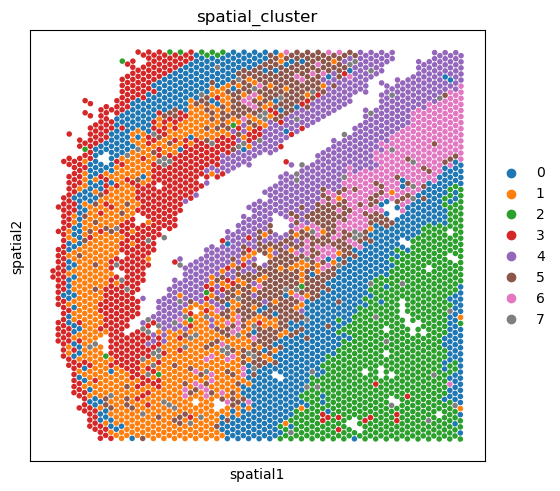

In [12]:
sq.pl.spatial_scatter(adata_n, color="spatial_cluster", size=1.3, img=None)

In [8]:
sc.tl.rank_genes_groups(adata_n, groupby='spatial_cluster', method='wilcoxon', use_raw=False, pts=True)
df_res = sc.get.rank_genes_groups_df(adata_n, group=None, pval_cutoff=0.05)
df_res['pct_diff'] = df_res['pct_nz_group'] - df_res['pct_nz_reference']
df_res = df_res[(df_res['logfoldchanges'] > 0) & (df_res['pvals_adj'] < 0.05) & (df_res['pct_diff'] > 0)]
df_res = df_res.groupby('group', group_keys=False).apply(lambda x: x.sort_values(['pct_diff', 'logfoldchanges'], ascending=False))

/tmp/slurmtmp.42005720/ipykernel_2988221/3972816741.py:5: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_res = df_res.groupby('group', group_keys=False).apply(lambda x: x.sort_values(['pct_diff', 'logfoldchanges'], ascending=False))


In [28]:
df_res[df_res['names'].isin(markers['L'])]

,group,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference,pct_diff
235,0,SATB2,13.330000,1.064303,1.548987e-40,1.106973e-38,0.772606,0.442768,0.329839
4913,0,HPCAL1,3.386180,0.176473,7.087293e-04,2.506580e-03,0.537234,0.386105,0.151129
8952,2,HPCAL1,10.900980,0.883719,1.140225e-27,5.595182e-26,0.682720,0.359191,0.323529
25357,4,LAMP5,8.417838,1.710817,3.834946e-17,2.414809e-15,0.368330,0.184904,0.183427
25371,4,HPCAL1,7.507446,1.069338,6.029183e-14,2.412879e-12,0.481928,0.401846,0.080081
34284,6,LAMP5,6.077116,0.955251,1.223630e-09,4.221525e-08,0.430921,0.192929,0.237992
36235,6,SATB2,3.728905,0.432545,1.923137e-04,1.390914e-03,0.684211,0.486869,0.197342


In [51]:
# m = {
#     "WM": ["4", "7", "8"],
#     "Outer": ["2", "6"],
#     "Inner": ["0", "1", "3", "5", "9"],
#     "Meninges": ["10", "11"]
# }

m = {
    "WM": ["0", "10"],
    "Outer": ["12", "14", "3", "8", ],
    "Inner": ["3", "4"],
    "Meninges": ["10", "11"]
}

In [52]:
plot_spatial_panels(adata_n, markers, m, save_path="results/nAD/GSM8184312/manual_ann_markers.png")

✅ Figure saved to: results/nAD/GSM8184312/manual_ann_markers.png


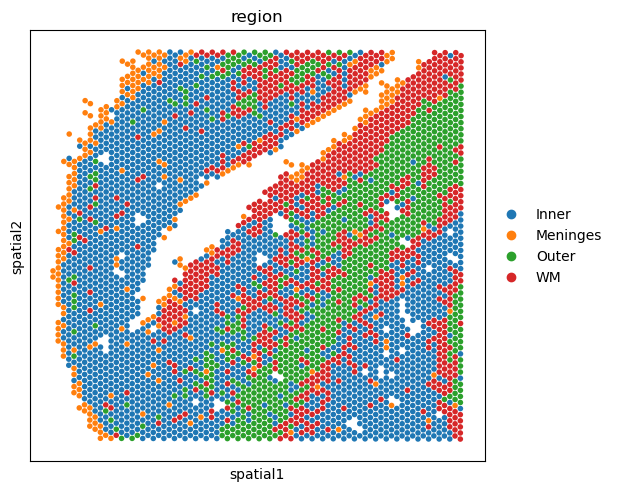

In [53]:
rev_map = {c: reg for reg, vals in m.items() for c in vals}
adata_n.obs["region"] = adata_n.obs["spatial_cluster"].astype(str).map(rev_map).fillna("Unknown")
sq.pl.spatial_scatter(adata_n, color="region", size=1.3, img=None)

In [27]:
adata_n.write_h5ad("c2l_res/nAD/GSM8184312_only_neurons.h5ad")

## Sample GSM8184313

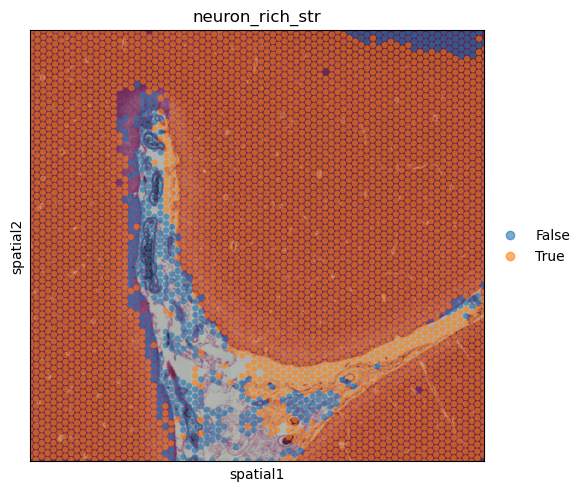

In [5]:
adata = sc.read_h5ad("c2l_res/nAD/GSM8184313_with_cells.h5ad")
adata.obs["neuron_rich_str"] = adata.obs["neuron_rich"].astype(str)
adata_n = adata[adata.obs['neuron_rich_str'] == "True"]

x = adata_n.obsm["spatial"][:, 0].astype(float)
y = adata_n.obsm["spatial"][:, 1].astype(float)
pad = 0
xmin, xmax = np.nanmin(x) - pad, np.nanmax(x) + pad
ymin, ymax = np.nanmin(y) - pad, np.nanmax(y) + pad
sq.pl.spatial_scatter(adata, color="neuron_rich_str", size=1.3, 
                      crop_coord=[(xmin, ymin, xmax, ymax)], alpha=0.6)

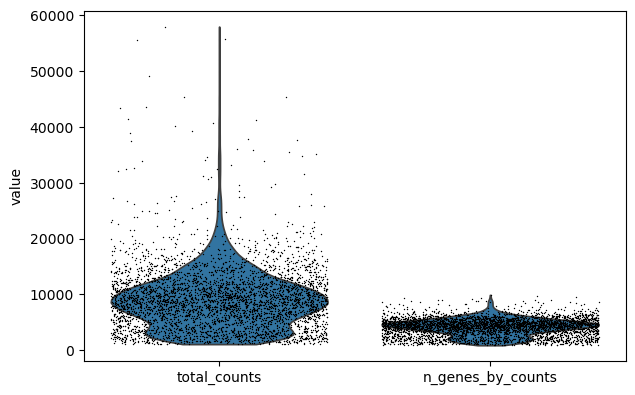

Median UMIs: 8641.0
Median number of genes: 4323.0


In [7]:
sc.pl.violin(adata_n, ['total_counts', 'n_genes_by_counts'], 
             jitter=0.4)
print(f"Median UMIs: {adata_n.obs['total_counts'].median()}")
print(f"Median number of genes: {adata_n.obs['n_genes_by_counts'].median()}")

In [8]:
# Normalize
sc.pp.normalize_total(adata_n, target_sum=1e4)
sc.pp.log1p(adata_n)
adata_n.raw = adata_n.copy()

# Spatial clustering
sc.pp.highly_variable_genes(adata_n, n_top_genes=2000, flavor='seurat')
adata_hvg = adata_n[:, adata_n.var.highly_variable].copy()
sc.pp.scale(adata_hvg, max_value=10)
sc.pp.pca(adata_hvg, n_comps=50)

valid_spatial = ~np.isnan(adata_hvg.obsm['spatial']).any(axis=1)
if not valid_spatial.all():
    adata_hvg = adata_hvg[valid_spatial].copy()

sq.gr.spatial_neighbors(adata_hvg, coord_type="generic", delaunay=True)
sc.pp.neighbors(adata_hvg, n_neighbors=15, use_rep='X_pca', n_pcs=10)
sc.tl.leiden(adata_hvg, resolution=1, key_added='spatial_cluster')
adata_n.obs['spatial_cluster'] = adata_hvg.obs['spatial_cluster']

/tmp/slurmtmp.42019001/ipykernel_1295640/4159327453.py:18: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata_hvg, resolution=1, key_added='spatial_cluster')


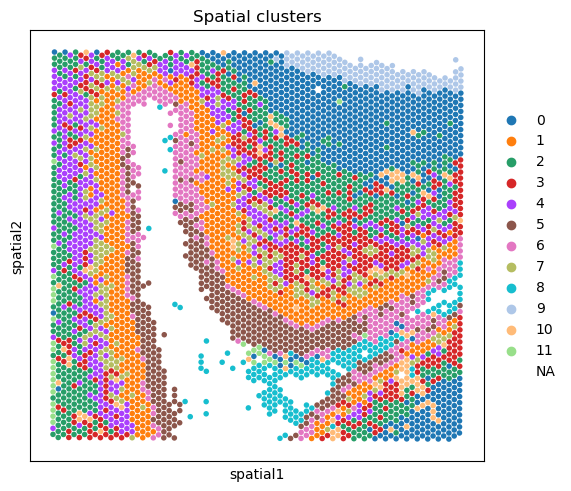

In [9]:
sq.pl.spatial_scatter(adata_n, color="spatial_cluster", title="Spatial clusters", size=1.3, img=None)
#plt.savefig("c2l_res/nAD/GSM8184313_clusters.png", dpi=300, bbox_inches='tight')

In [ ]:
sc.tl.rank_genes_groups(adata_n, groupby='spatial_cluster', method='wilcoxon', use_raw=False, pts=True)
df_res = sc.get.rank_genes_groups_df(adata_n, group=None, pval_cutoff=0.05)
df_res['pct_diff'] = df_res['pct_nz_group'] - df_res['pct_nz_reference']
df_res = df_res[(df_res['logfoldchanges'] > 0) & (df_res['pvals_adj'] < 0.05) & (df_res['pct_diff'] > 0)]
df_res = df_res.groupby('group', group_keys=False).apply(lambda x: x.sort_values(['pct_diff', 'logfoldchanges'], ascending=False))

In [25]:
df_res[df_res['names'].isin(markers['white'])]

,group,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference,pct_diff
145,0,MOBP,9.860418,0.763243,6.179155e-23,5.671897e-21,0.599696,0.359202,0.240494
1,0,MBP,24.591148,0.951406,1.570971e-133,1.413167e-129,1.000000,0.991685,0.008315
14016,3,MOBP,2.699515,0.025966,6.944063e-03,3.925389e-02,0.518962,0.379915,0.139047
15967,5,MBP,13.894400,0.656221,6.849509e-44,5.311617e-42,1.000000,0.992248,0.007752
41001,9,MOBP,16.540598,3.743158,1.871577e-61,1.122384e-57,0.957983,0.380125,0.577858
40999,9,MBP,18.600828,3.616509,3.163789e-77,5.691973e-73,1.000000,0.992764,0.007236


In [23]:
# m = {
#     "WM": ["8"],
#     "Outer": ["0", "2"],
#     "Inner": ["1", "3", "4", "5", "7"]
# }

m = {
    "WM": ["9"],
    "External": ["1", "5", "6", "2", "3", "4", "7", "10", "11"],
    "Internal": ["0"]
}
## Removed cluster 8 because is probably mostly meningeal

In [24]:
plot_spatial_panels(adata_n, markers, m, save_path="results/nAD/GSM8184313/manual_ann_markers.png")

✅ Figure saved to: results/nAD/GSM8184313/manual_ann_markers.png


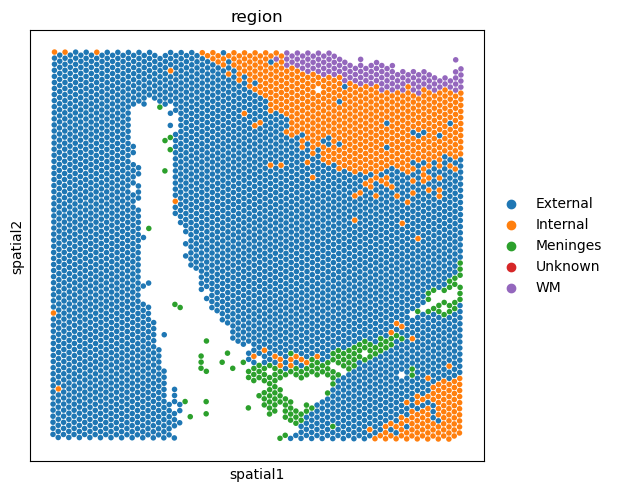

In [26]:
rev_map = {c: reg for reg, vals in m.items() for c in vals}
adata_n.obs["region"] = adata_n.obs["spatial_cluster"].astype(str).map(rev_map).fillna("Unknown")

#sq.pl.spatial_scatter(adata_n, color="region", size=1.3, crop_coord=[(xmin, ymin, xmax, ymax)], alpha=0.6)
sq.pl.spatial_scatter(adata_n, color="region", size=1.3, img=None)
plt.savefig("")

In [27]:
adata_n.write_h5ad("c2l_res/nAD/GSM8184313_only_neurons.h5ad")

In [2]:
adata_n = sc.read_h5ad("c2l_res/nAD/GSM8184313_only_neurons.h5ad")

In [28]:
adata_n_simple = adata_n.copy()

In [29]:
adata_n_simple

AnnData object with n_obs × n_vars = 4265 × 17991
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'n_counts', 'n_genes', 'sample', '_indices', '_scvi_batch', '_scvi_labels', 'Astro', 'Chandelier', 'Endo', 'L2/3 IT', 'L4 IT', 'L5 ET', 'L5 IT', 'L5/6 NP', 'L6 CT', 'L6 IT', 'L6 IT Car3', 'L6b', 'Lamp5', 'Lamp5_Lhx6', 'Micro-PVM', 'OPC', 'Oligo', 'Pax6', 'Pvalb', 'Sncg', 'Sst', 'Sst Chodl', 'VLMC', 'Vip', 'total_cells', 'total_neurons', 'neuron_rich', 'neuron_rich_str', 'spatial_cluster', 'region'
    var: 'gene_ids', 'feature_types', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'MT_gene', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'mod'

In [30]:
del adata_n_simple.obsm['means_cell_abundance_w_sf']
del adata_n_simple.obsm['q05_cell_abundance_w_sf']
del adata_n_simple.obsm['q95_cell_abundance_w_sf']
del adata_n_simple.obsm['stds_cell_abundance_w_sf'] 

In [31]:
adata_n_simple

AnnData object with n_obs × n_vars = 4265 × 17991
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'n_counts', 'n_genes', 'sample', '_indices', '_scvi_batch', '_scvi_labels', 'Astro', 'Chandelier', 'Endo', 'L2/3 IT', 'L4 IT', 'L5 ET', 'L5 IT', 'L5/6 NP', 'L6 CT', 'L6 IT', 'L6 IT Car3', 'L6b', 'Lamp5', 'Lamp5_Lhx6', 'Micro-PVM', 'OPC', 'Oligo', 'Pax6', 'Pvalb', 'Sncg', 'Sst', 'Sst Chodl', 'VLMC', 'Vip', 'total_cells', 'total_neurons', 'neuron_rich', 'neuron_rich_str', 'spatial_cluster', 'region'
    var: 'gene_ids', 'feature_types', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'MT_gene', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'mod'

In [32]:
adata_n_simple.write_h5ad("c2l_res/nAD/GSM8184313_only_neurons_simplified.h5ad")

## Calculate the microglial gene scores

In [27]:
homeostatic_microglia = ['P2RY12', 'P2RY13', 'CX3CR1']
activated_microglia = ['SPP1', 'CD9', 'TREM2']

In [28]:
adata1 = sc.read_h5ad("c2l_res/nAD/GSM8184313_only_neurons.h5ad")

In [60]:
# Score genes
sc.tl.score_genes(adata1, homeostatic_microglia, score_name='homeostatic_microglia', use_raw=True)
sc.tl.score_genes(adata1, activated_microglia, score_name='activated_microglia', use_raw=True)

# Calculate z-scores for both signatures
adata1.obs['activated_microglia_zscore'] = stats.zscore(adata1.obs['activated_microglia'])
adata1.obs['homeostatic_microglia_zscore'] = stats.zscore(adata1.obs['homeostatic_microglia'])

# Define threshold (e.g., z-score > 0.674 corresponds to top 25%)
z_threshold = 0.674  # or use: stats.norm.ppf(0.75)

# Determine activated: high z-score AND higher than homeostatic
is_activated = (
    (adata1.obs['activated_microglia_zscore'] > z_threshold) & 
    (adata1.obs['activated_microglia_zscore'] > adata1.obs['homeostatic_microglia_zscore'])
)

# Determine homeostatic: high z-score AND higher than activated
is_homeostatic = (
    (adata1.obs['homeostatic_microglia_zscore'] > z_threshold) & 
    (adata1.obs['homeostatic_microglia_zscore'] > adata1.obs['activated_microglia_zscore'])
)

# Apply to AnnData
adata1.obs['is_activated_microglia'] = is_activated
adata1.obs['is_homeostatic_microglia'] = is_homeostatic

# Rule: Set to False when region is not Inner or Outer
adata1.obs.loc[~adata1.obs['region'].isin(['Inner', 'Outer']), 'is_activated_microglia'] = False
adata1.obs.loc[~adata1.obs['region'].isin(['Inner', 'Outer']), 'is_homeostatic_microglia'] = False

# Convert to Categorical
adata1.obs['is_activated_microglia'] = pd.Categorical(adata1.obs['is_activated_microglia'])
adata1.obs['is_homeostatic_microglia'] = pd.Categorical(adata1.obs['is_homeostatic_microglia'])


In [57]:
sum(is_high_activated & is_high_homeostatic)

268

In [58]:
type(adata1.obs['region'].values)
#df1 = adata1.obs[['region', 'homeostatic_microglia', 'activated_microglia']]

pandas.core.arrays.categorical.Categorical

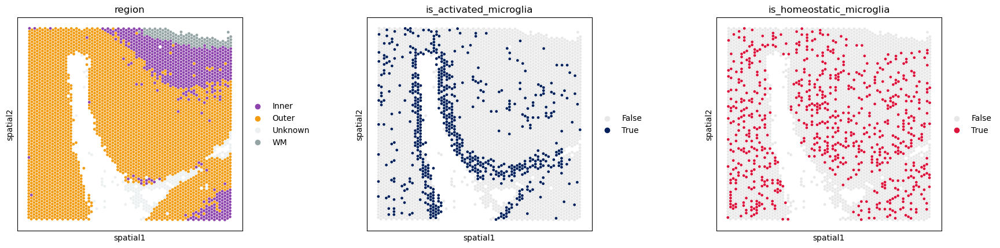

In [61]:
sq.pl.spatial_scatter(adata1, color=["region", "is_activated_microglia" , "is_homeostatic_microglia"], size=1.3, img=None)

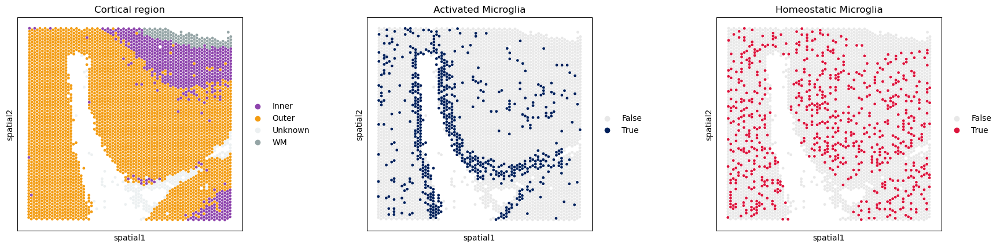

In [62]:
region_palette = {
    "Outer":   "#F39C12",   # Amber
    "Inner":   "#8E44AD",   # Purple
    "WM":      "#95A5A6",   # Off-white
    "Unknown": "#ECF0F1"    # Gray
}

# Get the order of categories in your data
region_order = adata1.obs['region'].cat.categories
adata1.uns['region_colors'] = [region_palette[r] for r in region_order]

# Microglia colors (as discussed)
adata1.uns['is_activated_microglia_colors'] = ['#E8E8E8', '#00205B']  # Gray, Dark blue
adata1.uns['is_homeostatic_microglia_colors'] = ['#E8E8E8', '#DC143C']  # Gray, Scarlet

# Plot with all custom colors
sq.pl.spatial_scatter(
    adata1, 
    color=["region", "is_activated_microglia", "is_homeostatic_microglia"], 
    title=["Cortical region", "Activated Microglia", "Homeostatic Microglia"],
    size=1.3, 
    img=None
)
plt.savefig("c2l_res/nAD/GSM8184313_regions_act_homeost.png", dpi=300, bbox_inches='tight')
plt.savefig("c2l_res/nAD/GSM8184313_regions_act_homeost.pdf", dpi=300, bbox_inches='tight')

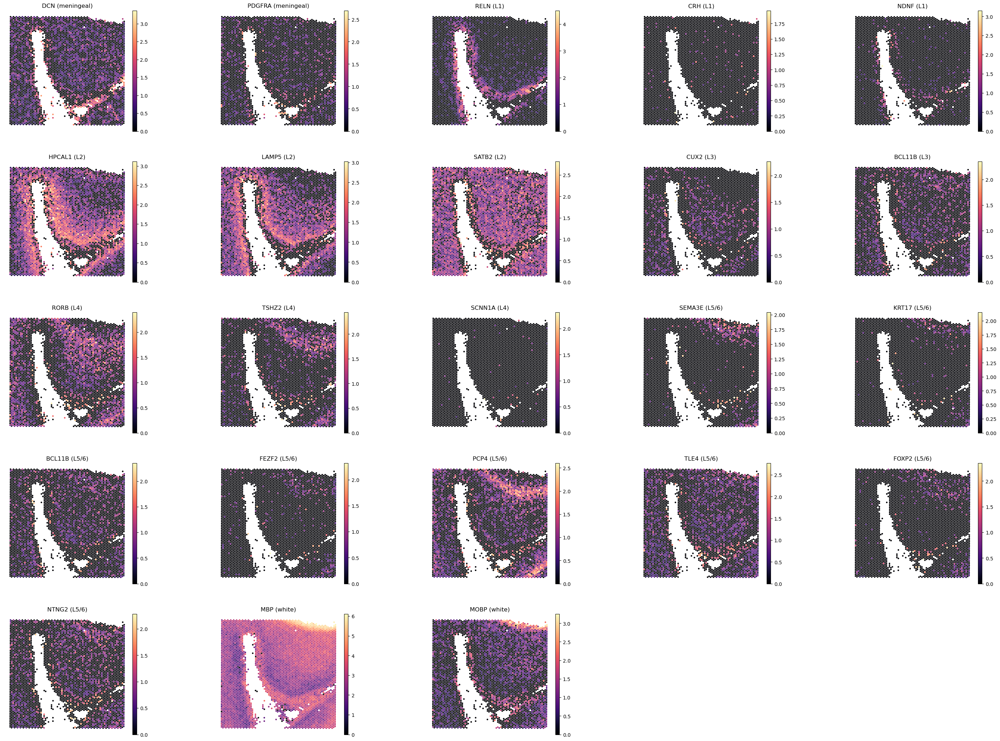

In [34]:
import matplotlib.pyplot as plt

# Create list with layer labels
genes_with_labels = []
titles_with_labels = []

for layer, genes in markers.items():
    for gene in genes:
        genes_with_labels.append(gene)
        titles_with_labels.append(f"{gene} ({layer})")

# Plot with layer labels AND nice customization
fig = sq.pl.spatial_scatter(
    adata1, 
    color=genes_with_labels,
    title=titles_with_labels,
    size=1.3, 
    img=None,
    cmap='magma',
    ncols=5,
    frameon=False
)

plt.savefig("c2l_res/nAD/layer_markers_labeled.png", dpi=300, bbox_inches='tight')
plt.show()

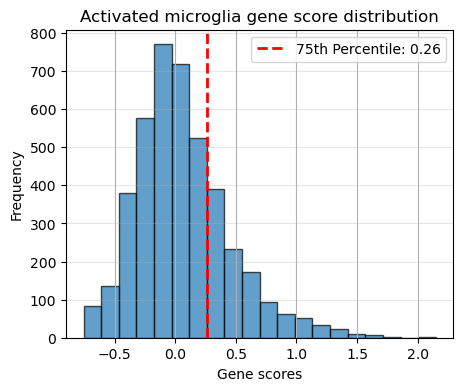

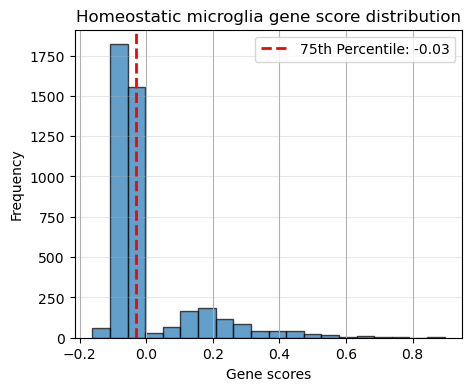

In [207]:
# Create the histogram
plt.figure(figsize=(5, 4))
percentile_75 = adata1.obs['activated_microglia'].quantile(0.75)
adata1.obs['activated_microglia'].hist(bins=20, alpha=0.7, edgecolor='black')

# Add a vertical line at the 0.75 percentile
plt.axvline(percentile_75, color='red', linestyle='--', linewidth=2, 
            label=f'75th Percentile: {percentile_75:.2f}')

# Customize the plot
plt.xlabel('Gene scores')
plt.ylabel('Frequency')
plt.title('Activated microglia gene score distribution')
plt.legend()
plt.grid(axis='y', alpha=0.3)
plt.savefig("c2l_res/nAD/activated_dist_GSM8184313.png")
plt.savefig("c2l_res/nAD/activated_dist_GSM8184313.pdf")

plt.show()

# Create the histogram
plt.figure(figsize=(5, 4))
percentile_75 = adata1.obs['homeostatic_microglia'].quantile(0.75)
adata1.obs['homeostatic_microglia'].hist(bins=20, alpha=0.7, edgecolor='black')

# Add a vertical line at the 0.75 percentile
plt.axvline(percentile_75, color='red', linestyle='--', linewidth=2, 
            label=f'75th Percentile: {percentile_75:.2f}')

# Customize the plot
plt.xlabel('Gene scores')
plt.ylabel('Frequency')
plt.title('Homeostatic microglia gene score distribution')
plt.legend()
plt.grid(axis='y', alpha=0.3)
plt.savefig("c2l_res/nAD/homeostatic_dist_GSM8184313.png")
plt.savefig("c2l_res/nAD/homeostatic_dist_GSM8184313.pdf")

plt.show()

In [145]:
adata1.obs.columns

Index(['in_tissue', 'array_row', 'array_col', 'n_genes_by_counts',
       'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts',
       'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes',
       'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes',
       'n_counts', 'n_genes', 'sample', '_indices', '_scvi_batch',
       '_scvi_labels', 'Astro', 'Chandelier', 'Endo', 'L2/3 IT', 'L4 IT',
       'L5 ET', 'L5 IT', 'L5/6 NP', 'L6 CT', 'L6 IT', 'L6 IT Car3', 'L6b',
       'Lamp5', 'Lamp5_Lhx6', 'Micro-PVM', 'OPC', 'Oligo', 'Pax6', 'Pvalb',
       'Sncg', 'Sst', 'Sst Chodl', 'VLMC', 'Vip', 'total_cells',
       'total_neurons', 'neuron_rich', 'neuron_rich_str', 'spatial_cluster',
       'region', 'homeostatic_microglia', 'is_homeostatic_microglia',
       'activated_microglia', 'is_activated_microglia'],
      dtype='object')

In [69]:
df = adata1.obs.copy()
df["estimated_micro"] = df['Micro-PVM']
df = df[df['region'].isin(['Inner', 'Outer'])]

In [70]:
df.columns

Index(['in_tissue', 'array_row', 'array_col', 'n_genes_by_counts',
       'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts',
       'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes',
       'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes',
       'n_counts', 'n_genes', 'sample', '_indices', '_scvi_batch',
       '_scvi_labels', 'Astro', 'Chandelier', 'Endo', 'L2/3 IT', 'L4 IT',
       'L5 ET', 'L5 IT', 'L5/6 NP', 'L6 CT', 'L6 IT', 'L6 IT Car3', 'L6b',
       'Lamp5', 'Lamp5_Lhx6', 'Micro-PVM', 'OPC', 'Oligo', 'Pax6', 'Pvalb',
       'Sncg', 'Sst', 'Sst Chodl', 'VLMC', 'Vip', 'total_cells',
       'total_neurons', 'neuron_rich', 'neuron_rich_str', 'spatial_cluster',
       'region', 'homeostatic_microglia', 'is_homeostatic_microglia',
       'activated_microglia', 'is_activated_microglia',
       'activated_microglia_zscore', 'homeostatic_microglia_zscore',
       'estimated_micro'],
      dtype='object')

In [72]:
import statsmodels.formula.api as smf
import pandas as pd

df['region'] = df['region'].cat.remove_unused_categories()
model = smf.ols("activated_microglia ~ region + estimated_micro", data=df).fit()
print(model.summary())

                             OLS Regression Results                            
Dep. Variable:     activated_microglia   R-squared:                       0.294
Model:                             OLS   Adj. R-squared:                  0.294
Method:                  Least Squares   F-statistic:                     827.5
Date:                 Tue, 11 Nov 2025   Prob (F-statistic):          3.24e-301
Time:                         18:19:21   Log-Likelihood:                -1146.4
No. Observations:                 3980   AIC:                             2299.
Df Residuals:                     3977   BIC:                             2318.
Df Model:                            2                                         
Covariance Type:             nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
Intercept          -0.2099      

In [68]:
model = smf.ols("homeostatic_microglia_zscore ~ region + estimated_micro", data=df).fit()
print(model.summary())

                                 OLS Regression Results                                 
Dep. Variable:     homeostatic_microglia_zscore   R-squared:                       0.016
Model:                                      OLS   Adj. R-squared:                  0.016
Method:                           Least Squares   F-statistic:                     32.77
Date:                          Tue, 11 Nov 2025   Prob (F-statistic):           7.70e-15
Time:                                  18:17:10   Log-Likelihood:                -5593.2
No. Observations:                          3980   AIC:                         1.119e+04
Df Residuals:                              3977   BIC:                         1.121e+04
Df Model:                                     2                                         
Covariance Type:                      nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
--------------------------

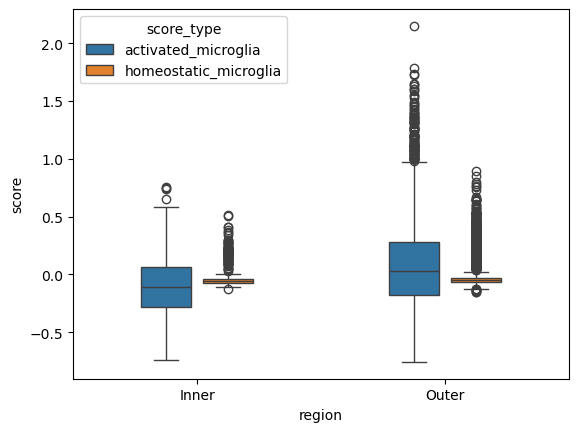

In [36]:
plot_df = df.melt(id_vars='region', value_vars=['activated_microglia', 'homeostatic_microglia'],
                  var_name='score_type', value_name='score')

sns.boxplot(data=plot_df, x='region', y='score', hue='score_type', dodge=True, width=0.5, gap=0.2)
plt.show()

/tmp/slurmtmp.41900491/ipykernel_3140458/260843442.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='region', y=score, ax=ax,
/tmp/slurmtmp.41900491/ipykernel_3140458/260843442.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='region', y=score, ax=ax,


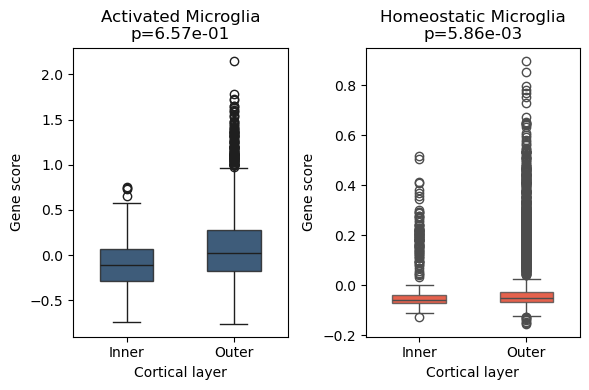

In [37]:
fig, axes = plt.subplots(1, 2, figsize=(6, 4))
configs = [
    ("activated_microglia", "#003366"),  # dark blue
    ("homeostatic_microglia", "#FF2400") # scarlet
]

for ax, (score, color) in zip(axes, configs):
    m = smf.ols(f"{score} ~ region + estimated_micro", data=df).fit()
    p = m.pvalues["region[T.Outer]"]
    sns.boxplot(data=df, x='region', y=score, ax=ax,
                palette={'Inner': color, 'Outer': color}, boxprops=dict(alpha=0.8), width=0.5)
    ax.set_title(f"{score.replace('_',' ').title()}\np={p:.2e}")
    ax.set_xlabel("Cortical layer")
    ax.set_ylabel("Gene score")

plt.tight_layout()
plt.savefig("c2l_res/nAD/comp_GSM8184313.png", dpi=300, bbox_inches='tight')
plt.show()

In [40]:
from scipy import stats
from scipy.stats import boxcox
from scipy.stats import rankdata

df['activated_microglia_log'] = np.log1p(df['activated_microglia'])
df['homeostatic_microglia_log'] = np.log1p(df['homeostatic_microglia'])

df['activated_microglia_sqrt'] = np.sqrt(df['activated_microglia']+1)
df['homeostatic_microglia_sqrt'] = np.sqrt(df['homeostatic_microglia'] +1)

df['activated_microglia_bc'], lambda_act = boxcox(df['activated_microglia'] + 1)
df['homeostatic_microglia_bc'], lambda_home = boxcox(df['homeostatic_microglia'] + 1)

df['activated_microglia_rank'] = rankdata(df['activated_microglia'])
df['homeostatic_microglia_rank'] = rankdata(df['homeostatic_microglia'])

# Check normality of residuals for each transformation
transformations = {
    'Original': ['activated_microglia', 'homeostatic_microglia'],
    'Log': ['activated_microglia_log', 'homeostatic_microglia_log'],
    'Sqrt': ['activated_microglia_sqrt', 'homeostatic_microglia_sqrt'],
    'BoxCox': ['activated_microglia_bc', 'homeostatic_microglia_bc'],
    'Rank': ['activated_microglia_rank', 'homeostatic_microglia_rank']
}

print("Shapiro-Wilk test for normality of residuals (higher p-value = better):\n")
for transform_name, scores in transformations.items():
    for score in scores:
        if score in df.columns:
            model = smf.ols(f"{score} ~ region + estimated_micro", data=df).fit()
            w_stat, p_val = stats.shapiro(model.resid)
            print(f"{transform_name:10s} - {score:30s}: p={p_val:.4f}")

Shapiro-Wilk test for normality of residuals (higher p-value = better):

Original   - activated_microglia           : p=0.0000
Original   - homeostatic_microglia         : p=0.0000
Log        - activated_microglia_log       : p=0.0000
Log        - homeostatic_microglia_log     : p=0.0000
Sqrt       - activated_microglia_sqrt      : p=0.0000
Sqrt       - homeostatic_microglia_sqrt    : p=0.0000
BoxCox     - activated_microglia_bc        : p=0.0000
BoxCox     - homeostatic_microglia_bc      : p=0.0000
Rank       - activated_microglia_rank      : p=0.0000
Rank       - homeostatic_microglia_rank    : p=0.0000


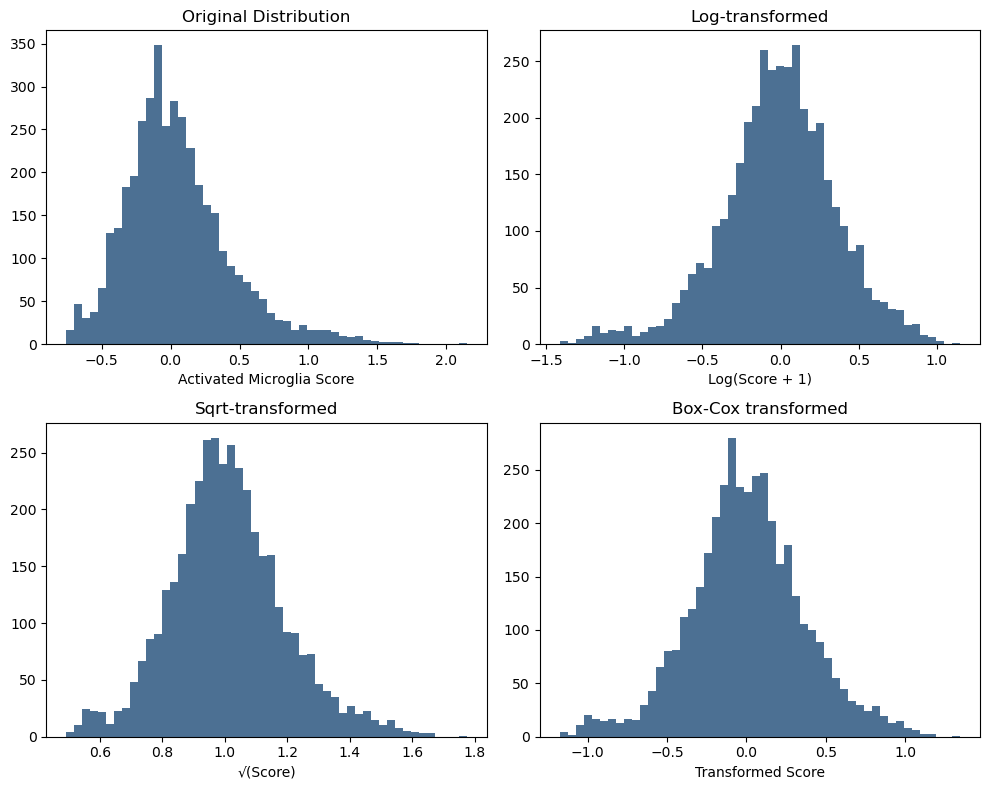

In [41]:
fig, axes = plt.subplots(2, 2, figsize=(10, 8))

# Original
axes[0,0].hist(df['activated_microglia'], bins=50, alpha=0.7, color='#003366')
axes[0,0].set_title('Original Distribution')
axes[0,0].set_xlabel('Activated Microglia Score')

# Log transformed
axes[0,1].hist(df['activated_microglia_log'], bins=50, alpha=0.7, color='#003366')
axes[0,1].set_title('Log-transformed')
axes[0,1].set_xlabel('Log(Score + 1)')

# Square root
axes[1,0].hist(df['activated_microglia_sqrt'], bins=50, alpha=0.7, color='#003366')
axes[1,0].set_title('Sqrt-transformed')
axes[1,0].set_xlabel('√(Score)')

# Box-Cox
axes[1,1].hist(df['activated_microglia_bc'], bins=50, alpha=0.7, color='#003366')
axes[1,1].set_title('Box-Cox transformed')
axes[1,1].set_xlabel('Transformed Score')

plt.tight_layout()
plt.savefig("transformation_comparison.png", dpi=300, bbox_inches='tight')
plt.show()

Quantile regression p-value: 1.3369e-13
Quantile regression p-value: 3.3394e-01


/tmp/slurmtmp.41900491/ipykernel_3140458/3894238071.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='region', y=score, ax=ax,
/tmp/slurmtmp.41900491/ipykernel_3140458/3894238071.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='region', y=score, ax=ax,


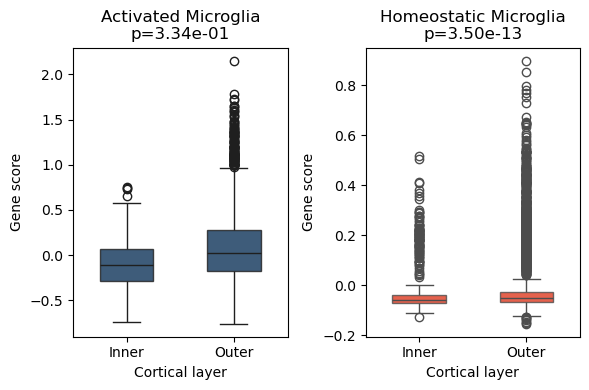

In [47]:
fig, axes = plt.subplots(1, 2, figsize=(6, 4))
configs = [
    ("activated_microglia", "#003366"),  # dark blue
    ("homeostatic_microglia", "#FF2400") # scarlet
]

for ax, (score, color) in zip(axes, configs):
    m = smf.quantreg(f"{score} ~ region + estimated_micro", data=df).fit()
    print(f"Quantile regression p-value: {p:.4e}")
    p = m.pvalues["region[T.Outer]"]
    sns.boxplot(data=df, x='region', y=score, ax=ax,
                palette={'Inner': color, 'Outer': color}, boxprops=dict(alpha=0.8), width=0.5)
    ax.set_title(f"{score.replace('_',' ').title()}\np={p:.2e}")
    ax.set_xlabel("Cortical layer")
    ax.set_ylabel("Gene score")

plt.tight_layout()
plt.savefig("c2l_res/nAD/comp_GSM8184313.png", dpi=300, bbox_inches='tight')
plt.show()

In [44]:
df['activated_microglia_log'] = np.log1p(df['activated_microglia'])
df['homeostatic_microglia_log'] = np.log1p(df['homeostatic_microglia'])

# Test both original and transformed
print("\nCOMPARISON: Original vs Log-transformed")
print("=" * 50)

for score in ['activated_microglia', 'homeostatic_microglia']:
    # Original
    w_orig, p_orig = stats.shapiro(df[score])
    # Transformed
    w_log, p_log = stats.shapiro(df[f'{score}_log'])
    
    print(f"\n{score}:")
    print(f"  Original:     p={p_orig:.4e}")
    print(f"  Log-transform: p={p_log:.4e}")
    print(f"  Improvement: {'Yes' if p_log > p_orig else 'No'}")


COMPARISON: Original vs Log-transformed

activated_microglia:
  Original:     p=1.2013e-34
  Log-transform: p=1.4804e-18
  Improvement: Yes

homeostatic_microglia:
  Original:     p=3.3897e-68
  Log-transform: p=5.3685e-66
  Improvement: Yes


In [48]:
from scipy.stats import chi2_contingency
import pandas as pd
import numpy as np

# Perform chi-square tests
results = {}

for microglia_type in ['is_activated_microglia', 'is_homeostatic_microglia']:
    # Create contingency table
    contingency = pd.crosstab(df['region'], df[microglia_type])
    
    # Perform chi-square test
    chi2, p, dof, expected = chi2_contingency(contingency)
    
    # Calculate Cramér's V (effect size)
    n = contingency.sum().sum()
    cramers_v = np.sqrt(chi2 / (n * (min(contingency.shape) - 1)))
    
    results[microglia_type] = {
        'contingency': contingency,
        'chi2': chi2,
        'p_value': p,
        'cramers_v': cramers_v,
        'expected': expected
    }
    
    print(f"\n{'='*60}")
    print(f"{microglia_type.replace('_', ' ').upper()}")
    print(f"{'='*60}")
    print("\nContingency Table (Observed):")
    print(contingency)
    print(f"\nChi-square statistic: {chi2:.4f}")
    print(f"p-value: {p:.4e}")
    print(f"Cramér's V (effect size): {cramers_v:.4f}")
    print(f"Degrees of freedom: {dof}")


IS ACTIVATED MICROGLIA

Contingency Table (Observed):
is_activated_microglia  False  True
region                             
Inner                     599    58
Outer                    2435   888

Chi-square statistic: 95.9604
p-value: 1.1721e-22
Cramér's V (effect size): 0.1553
Degrees of freedom: 1

IS HOMEOSTATIC MICROGLIA

Contingency Table (Observed):
is_homeostatic_microglia  False  True
region                               
Inner                       538   119
Outer                      2431   892

Chi-square statistic: 21.6067
p-value: 3.3469e-06
Cramér's V (effect size): 0.0737
Degrees of freedom: 1


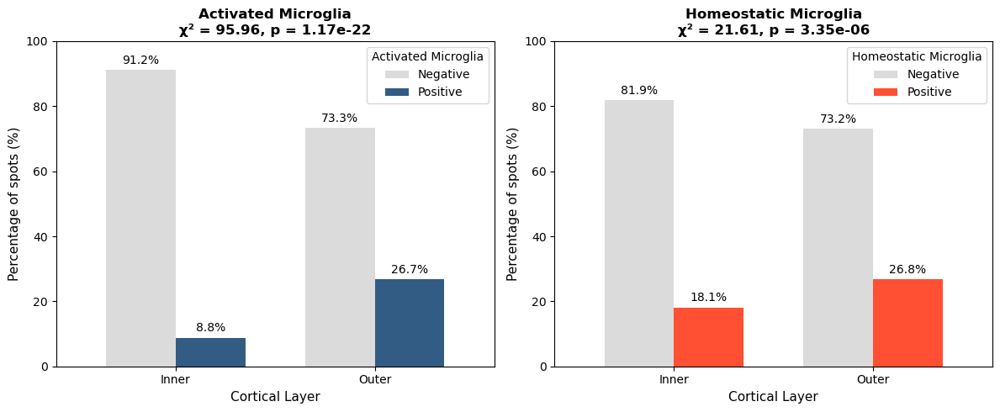

In [63]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import chi2_contingency

fig, axes = plt.subplots(1, 2, figsize=(12, 5))

microglia_types = ['is_activated_microglia', 'is_homeostatic_microglia']
colors = ['#003366', '#FF2400']
titles = ['Activated Microglia', 'Homeostatic Microglia']

for ax, microglia_type, color, title in zip(axes, microglia_types, colors, titles):
    # Create contingency table
    contingency = pd.crosstab(df['region'], df[microglia_type], normalize='index') * 100
    
    # Chi-square test
    obs = pd.crosstab(df['region'], df[microglia_type])
    chi2, p, dof, expected = chi2_contingency(obs)
    
    # Plot grouped bar chart
    contingency.plot(kind='bar', ax=ax, color=['lightgray', color], alpha=0.8, width=0.7)
    
    # Customize
    ax.set_title(f"{title}\nχ² = {chi2:.2f}, p = {p:.2e}", fontsize=12, fontweight='bold')
    ax.set_xlabel("Cortical Layer", fontsize=11)
    ax.set_ylabel("Percentage of spots (%)", fontsize=11)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=0)
    ax.legend(title=title, labels=['Negative', 'Positive'], loc='upper right')
    ax.set_ylim(0, 100)
    
    # Add percentage labels on bars
    for container in ax.containers:
        ax.bar_label(container, fmt='%.1f%%', padding=3)

plt.tight_layout()
plt.savefig("c2l_res/nAD/GSM8184313_chi_square_microglia_layers.png", dpi=300, bbox_inches='tight')

In [75]:
df = adata1.obs[adata1.obs['region'].isin(['Inner', 'Outer'])].copy()

# Create microglia state column
df['microglia_state'] = 'Neither'
df.loc[df['is_activated_microglia'] == True, 'microglia_state'] = 'Activated'
df.loc[df['is_homeostatic_microglia'] == True, 'microglia_state'] = 'Homeostatic'

# Filter to only Activated and Homeostatic (exclude Neither)
df_filtered = df[df['microglia_state'].isin(['Activated', 'Homeostatic'])]

# Contingency table: microglia_state (rows) vs region (columns)
contingency = pd.crosstab(df_filtered['microglia_state'], df_filtered['region'])
print(contingency)

# Chi-square test
chi2, p, dof, expected = chi2_contingency(contingency)
print(f"\nχ² = {chi2:.2f}, p = {p:.4e}")

region           Inner  Outer
microglia_state              
Activated           32    613
Homeostatic         83    640

χ² = 17.98, p = 2.2372e-05


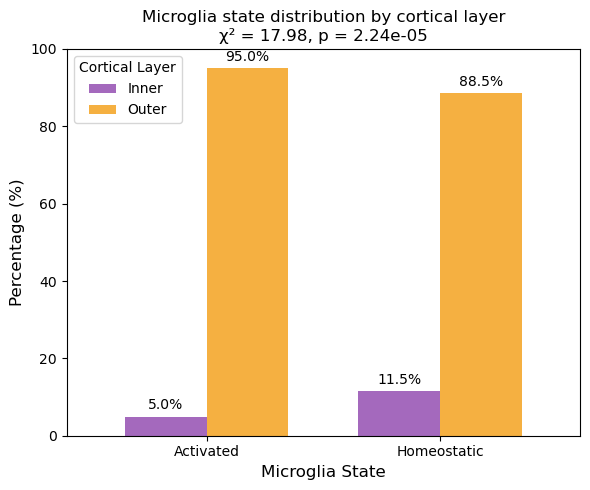

In [83]:
# Percentage table
percentages = pd.crosstab(df_filtered['microglia_state'], df_filtered['region'], normalize='index') * 100

# Plot
fig, ax = plt.subplots(figsize=(6, 5))

# Grouped bar chart
percentages.plot(kind='bar', ax=ax, color=['#8E44AD', '#F39C12'], alpha=0.8, width=0.7)

# Customize
ax.set_title(f"Microglia state distribution by cortical layer\nχ² = {chi2:.2f}, p = {p:.2e}", 
             fontsize=12)
ax.set_xlabel("Microglia State", fontsize=12)
ax.set_ylabel("Percentage (%)", fontsize=12)
ax.set_xticklabels(['Activated', 'Homeostatic'], rotation=0)
ax.legend(title='Cortical Layer', labels=['Inner', 'Outer'], loc='upper left')
ax.set_ylim(0, 100)

# Add percentage labels on bars
for container in ax.containers:
    ax.bar_label(container, fmt='%.1f%%', padding=3)

plt.tight_layout()
plt.savefig("c2l_res/nAD/GSM8184313_chi_square_indep_microglia_state_layers.png", dpi=300, bbox_inches='tight')
plt.show()